r=0.326, theta=0.793


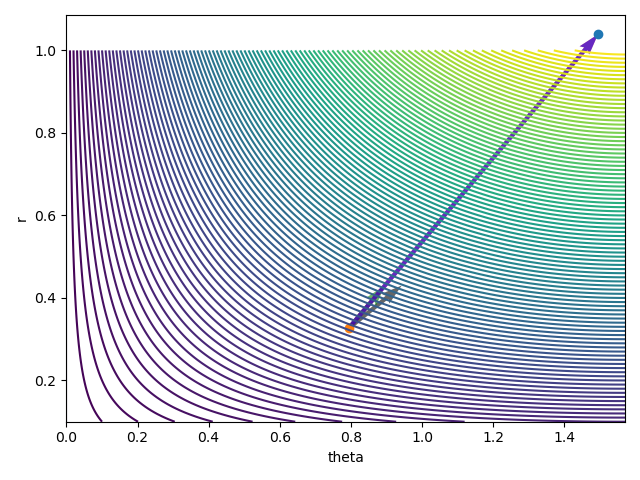

In [2]:
import numpy as np
from matplotlib import pyplot as plt

%matplotlib widget

r = np.linspace(0.1,1,200)
theta = np.linspace(0,np.pi/2,100)

thg,rg = np.meshgrid(theta,r)

def fn(r,theta):
    return r*np.sin(theta)

f_gr = fn(rg,thg)

dfdr,dfdth = np.gradient(f_gr,r,theta)
i = 50
j = 50

v_test = np.sin(thg[i,j]) #dfdr
u_test = np.cos(thg[i,j]) #dfdtheta/r

print(f"r={rg[i,j]:0.3f}, theta={thg[i,j]:0.3f}")

endpoint_theta = thg[i,j] + 1/rg[i,j]*dfdth[i,j]
endpoint_r = rg[i,j] + dfdr[i,j]

fig,ax = plt.subplots()
ax.contour(thg,rg,f_gr,levels=100)
ax.quiver(thg[i,j],rg[i,j],thg[i,j] + 1/rg[i,j]*dfdth[i,j],rg[i,j] + dfdr[i,j],angles='xy',scale=10,alpha =0.6,scale_units='xy')
ax.quiver(thg[i,j],rg[i,j],thg[i,j] + dfdth[i,j],rg[i,j] + dfdr[i,j],angles='xy',scale=10,alpha =0.6,scale_units='xy',color='g')
ax.quiver(thg[i,j],rg[i,j],1/rg[i,j]*dfdth[i,j],dfdr[i,j],scale=1,alpha =0.6,color='r',scale_units='xy',angles='xy')
ax.quiver(thg[i,j],rg[i,j],u_test,v_test,color='b',scale=1,alpha=0.6,scale_units='xy',angles='xy')
ax.scatter(endpoint_theta,endpoint_r)
ax.scatter(thg[i,j],rg[i,j])
ax.set(xlabel='theta',ylabel='r')
plt.tight_layout()
plt.show()

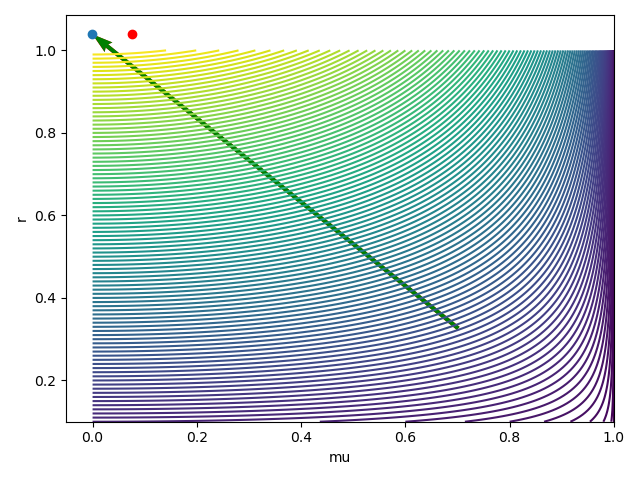

In [3]:
# let mu = cos theta
mug = np.cos(thg)
mu = np.cos(theta)

def fn_mu(r,mu):
    return r*np.sqrt(1 - mu**2)

f2_gr = fn_mu(rg,mug)
dfdr_2,dfdmu = np.gradient(f_gr, r,mu)

v_test_2 = np.sqrt(1-mug[i,j]**2)
u_test_2 =  -rg[i,j]*mug[i,j]/np.sqrt(1-mug[i,j]**2)

fig,ax = plt.subplots()
ax.contour(mug,rg,f_gr,levels=100)
ax.quiver(mug[i,j],rg[i,j],np.sqrt(1-mug[i,j]**2)/rg[i,j]*dfdmu[i,j],dfdr[i,j],scale=1,color='r',angles='xy',scale_units='xy')
ax.quiver(mug[i,j],rg[i,j],np.sqrt(1-mug[i,j]**2)/rg[i,j]*u_test_2,v_test_2,scale=1,color='g',angles='xy',scale_units='xy')
ax.scatter(mug[i,j] + np.sqrt(1-mug[i,j]**2)/rg[i,j]*dfdmu[i,j], rg[i,j] + dfdr[i,j])
ax.scatter(np.cos(endpoint_theta),endpoint_r, c='r')
ax.set(xlabel='mu',ylabel='r')
plt.tight_layout()
plt.show()

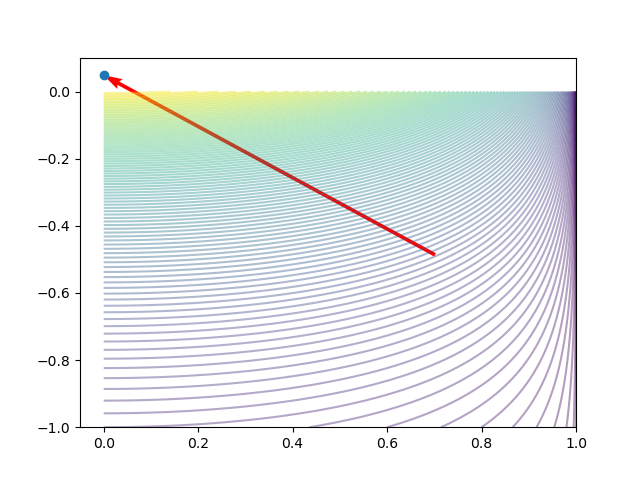

In [4]:
#Now logarithm

log_xg = np.log10(rg)
log_x = np.log10(r)
dfdx,dfdmu = np.gradient(f_gr,log_x,mu)

fig,ax = plt.subplots()
ax.contour(mug,log_xg,f_gr,levels=100,alpha = 0.4)
ax.quiver(mug[i,j],log_xg[i,j],np.sqrt(1-mug[i,j]**2)/rg[i,j]*dfdmu[i,j],dfdx[i,j],scale=1,color='r',angles='xy',scale_units='xy')                                                                                             
ax.scatter(mug[i,j] + np.sqrt(1-mug[i,j]**2)/rg[i,j]*dfdmu[i,j], log_xg[i,j] + dfdx[i,j])
plt.show()

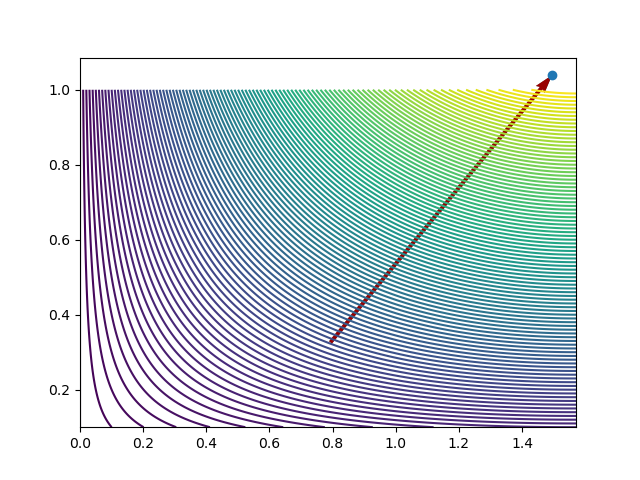

In [5]:
# recover (r,theta) plot from (r,mu) plot

dfdtheta = -np.sin(thg)*dfdmu

fig,ax = plt.subplots()
ax.contour(np.arccos(mug),rg,f_gr,levels=100)
ax.quiver(np.arccos(mug[i,j]),rg[i,j],1/rg[i,j]*dfdtheta[i,j],dfdr[i,j],scale=1,angles='xy',scale_units='xy')
ax.quiver(thg[i,j],rg[i,j],1/rg[i,j]*dfdth[i,j],dfdr[i,j],scale=1,alpha =0.6,color='r',scale_units='xy',angles='xy')
ax.scatter(endpoint_theta,endpoint_r)
plt.show()

/Users/ryanbrunet/mambaforge/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


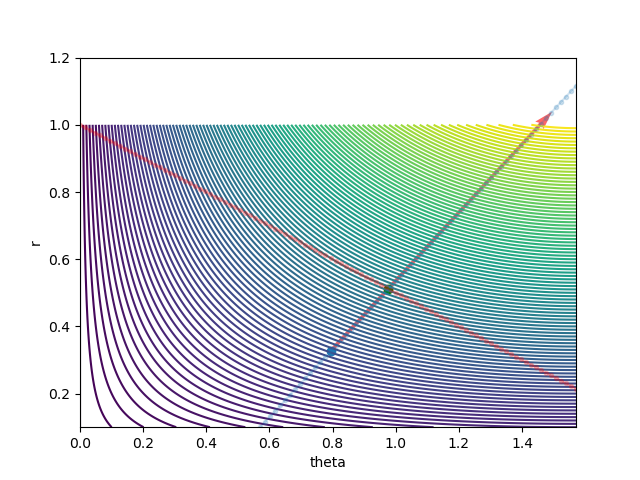

In [6]:
# check that intersection can be found
from shapely.geometry import LineString
import shapely
th0 = thg[i,j]
r0=rg[i,j]

vector_gradient = dfdr[i,j]/(1/r0*dfdth[i,j])

y = r0 + vector_gradient*(theta - th0)

# test intersection line
r1=0.6
th1=0.8
r2=0.4
th2 = 1.2
m = (r2-r1)/(th2-th1)
y2 = m*(theta - th1) + r1

vector_linestring = np.c_[theta, y]
ls1 = LineString(np.c_[theta, y2])
ls2 = LineString(np.c_[theta, y])

# print(
points = shapely.intersection(ls1,ls2)
th_int,r_int = points.x,points.y

fig,ax = plt.subplots()
ax.contour(np.arccos(mug),rg,f_gr,levels=100)
ax.quiver(thg[i,j],rg[i,j],1/rg[i,j]*dfdth[i,j],dfdr[i,j],scale=1,alpha =0.6,color='r',scale_units='xy',angles='xy')
# ax.quiver(thg[i,j],rg[i,j],1/rg[i,j]*dfdth[i,j],dfdr[i,j],scale=1,alpha =0.6,color='r',units='xy')

ax.scatter(th0,r0)
ax.scatter(th_int,r_int,color='g')
ax.plot(theta,y,'.-', alpha = 0.2)
ax.plot(theta,y2,'.-', c='r',alpha=0.2)
ax.set(xlabel="theta",ylabel="r", ylim=[0.1,1.2])
plt.show()

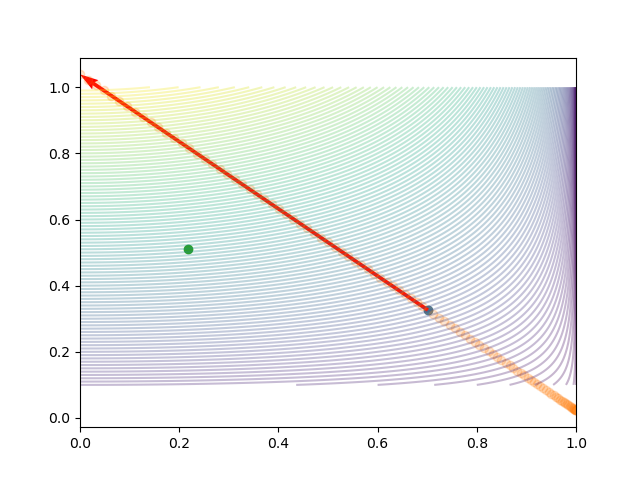

In [7]:

mu0 = mug[i,j]
vector_grad_2 = dfdr[i,j]/(np.sqrt(1-mu0**2)/r0*dfdmu[i,j])

y3 = r0 + vector_grad_2*(mu - mu0)

fig,ax = plt.subplots()
ax.contour(mug,rg,f_gr,levels=100,alpha=0.3)
ax.scatter(mu0,r0)
ax.quiver(mug[i,j],rg[i,j],np.sqrt(1-mug[i,j]**2)/rg[i,j]*dfdmu[i,j],dfdr[i,j],scale=1,color='r',angles='xy',scale_units='xy')
# ax.quiver(mug[i,j],rg[i,j],np.sqrt(1-mug[i,j]**2)/rg[i,j]*dfdmu[i,j],dfdr[i,j],color='r',units='xy',scale=1)

ax.scatter(np.cos(theta),y3,alpha = 0.2)
ax.scatter(np.arccos(th_int),r_int)
plt.show()

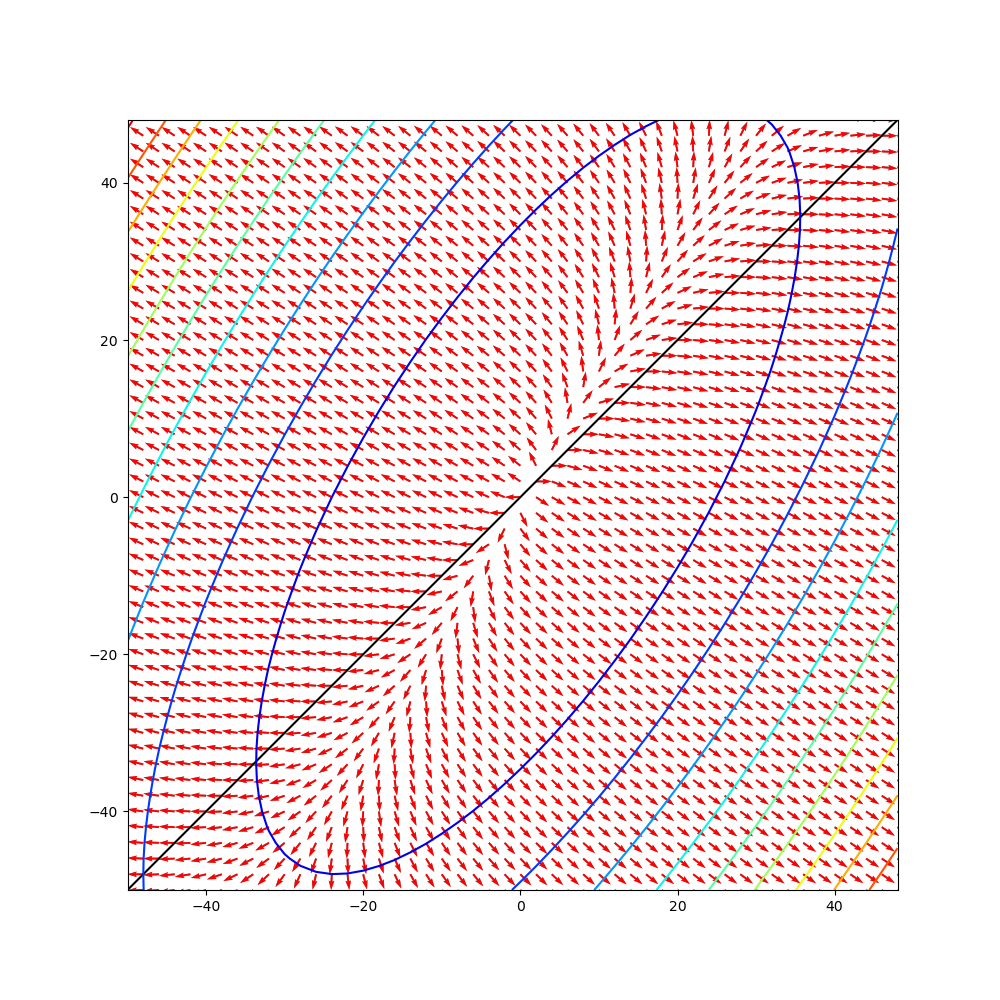

In [8]:
feature_x = np.arange(-50, 50, 2)
feature_y = np.arange(-50, 50, 2)

x, y = np.meshgrid(feature_x, feature_y)
z = 0.5*(y-x)**2 + 0.5*(1-x)**2
u = 2*x - y - 1
v = y - x

grady,gradx= np.gradient(z,feature_x,feature_y)
norm_grad = np.linalg.norm(np.array((gradx,grady)),axis=0)

gx = gradx/norm_grad
gy = grady/norm_grad

# Normalize all gradients to focus on the direction not the magnitude
norm = np.linalg.norm(np.array((u, v)), axis=0)
u = u / norm
v = v / norm


fig, ax = plt.subplots(1, 1,figsize=(10,10))
ax.set_aspect(1)
ax.plot(feature_x, feature_y, c='k')
ax.quiver(x, y, u, v, units='xy', scale=0.5, color='gray')
ax.quiver(x, y, gx, gy, units='xy',scale=0.5, color='r')
ax.contour(x, y, z, 10, cmap='jet')
plt.show()
# arrow = FancyArrowPatch((35, 35), (35+34*0.2, 35+0), arrowstyle='simple',
#                         color='r', mutation_scale=10)  
# ax.add_patch(arrow)  # NOTE: this gradient is scaled to make it better visible

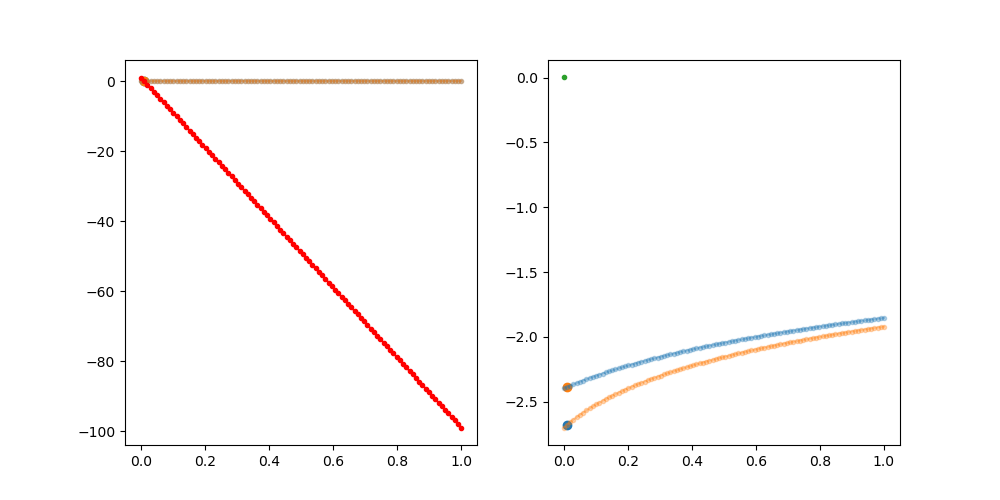

In [9]:
x = np.linspace(0,1,100)

m = 0.01
y1 = (x+0.4)*m
y2 = (x+0.2)*m

dy = y1-y2
dy=dy[0]

x0 = 0.01
y0 = (x0 +0.2)*m
theta = np.arctan(m)
dx = -dy*np.tan(theta)

normal_gradient = -1/m

y_normal = y0 + normal_gradient*(x-x0)

fig,(ax,ax2) = plt.subplots(1,2,figsize=(10,5))
ax.plot(x,y1,'.-', alpha=0.3)
ax.plot(x,y2,'.-', alpha=0.3)
ax2.plot(x,np.log10(y1),'.-', alpha=0.3)
ax2.plot(x,np.log10(y2),'.-', alpha=0.3)
# ax.set(ylim=[0,1])
ax.scatter(x0,y0)
ax.scatter(x0+dx,y0+dy)
ax.plot(x,y_normal,'.-',c='r')
ax2.plot(x[y_normal>0],np.log10(y_normal[y_normal>0]),'.-')
ax2.scatter(x0,np.log10(y0))
ax2.scatter(x0+dx,np.log10(y0+dy))
plt.show()


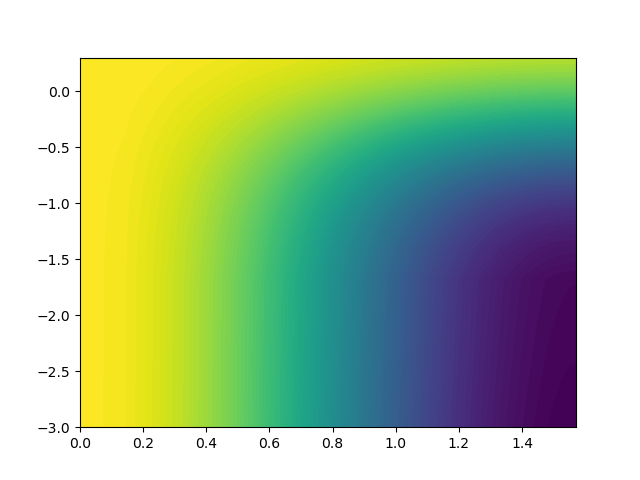

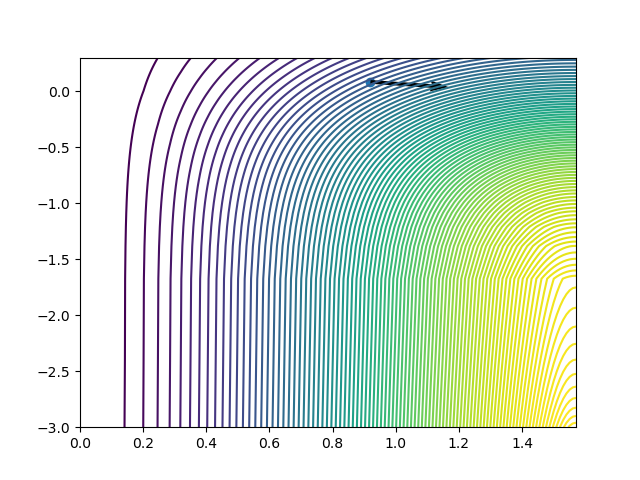

In [10]:
R = 1
r = np.linspace(R+0.001,3*R,100)
mu = np.linspace(0,1,100)
theta = np.arccos(mu)
x = r-R
thg,rg = np.meshgrid(theta,r)
xg= rg-R
mug = np.cos(thg)
psig = np.sin(thg)**2/(xg + R)
n_contours = 99
dx=x[1]-x[0]
dmu=mu[1]-mu[0]

mu_levels = np.empty(n_contours)

for i in range(n_contours):
    contour_mesh_value = (n_contours - i)/(n_contours+1.)/dmu
    mu_levels[i] = contour_mesh_value*dmu
    
psi_levels = (1-mu_levels*mu_levels)

dpsidx,dpsidmu = np.gradient(psig,x,mu)

i = 60
j = 60

x0 = xg[i,j]
mu0 = mug[i,j]


u = np.sqrt(1-mu0**2)/(x0+R)*dpsidmu[i,j]
v = dpsidx[i,j]

fig,ax = plt.subplots()
ax.contour(np.arccos(mug),np.log10(xg),psig,levels=psi_levels)
ax.scatter(np.arccos(mu0),np.log10(x0))
ax.quiver(np.arccos(mu0),np.log10(x0),-u/np.sqrt(1-mu0**2),v/np.log(10)/x0,angles='xy',scale_units='xy',scale=1)

fig,ax = plt.subplots()
ax.contourf(np.arccos(mug),np.log10(xg),dpsidx,levels=100)
plt.show()


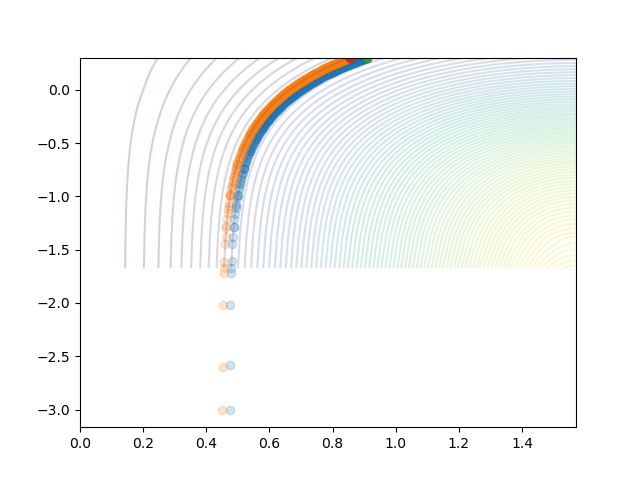

In [11]:
# use shapely.project to find point on adjacent closest to point of interest on contour
from contourpy import contour_generator
from shapely import Point
# get contour array of psi above
def gen_contour_array(xgrid, mugrid, psi_grid, psi_levels):

    cont_gen = contour_generator(mugrid, xgrid, psi_grid, quad_as_tri=True)
    lines_arr_0 = np.array(cont_gen.lines(psi_levels[0]))[0]
    contour_array = np.hstack((lines_arr_0,np.reshape(np.zeros(len(lines_arr_0)),(-1,1))))
    for index in range(1,len(psi_levels)):
        # check if cont_gen.lines() returns an empty array:
        if(len(cont_gen.lines(psi_levels[index])) == 0):
            continue
        else:
            lines = np.array(cont_gen.lines(psi_levels[index])[0])
            contour_array = np.append(contour_array, np.hstack((lines, np.reshape(index*np.ones(len(lines)), (-1,1)))), axis=0)

    # remove any contour coordinates below some limit xlim:
    # contour_array_output = contour_array[((contour_array[:,1] < 1.e-10))|(contour_array[:,1] > 1.e-3)]

    return contour_array

contour_array = gen_contour_array(xg,mug,psig,psi_levels)

index=10
mucoords = contour_array[contour_array[:, 2] == index][:, 0]
xcoords = contour_array[contour_array[:, 2] == index][:, 1]

mucoords_adj = contour_array[contour_array[:, 2] == index-1][:, 0]
xcoords_adj = contour_array[contour_array[:, 2] == index-1][:, 1]

# generate linestring object from the coordinate arrays:
ls1 = LineString(np.c_[mucoords, xcoords])
ls2 = LineString(np.c_[mucoords_adj, xcoords_adj])

for i in range(0,len(mucoords)):

    distance = ls2.project(Point((mucoords[i],xcoords[i])))
    int_point=ls2.interpolate(distance)
    
fig,ax = plt.subplots()
ax.contour(np.arccos(mug[1:,:]),np.log10(xg[1:,:]),psig[1:,:],levels=psi_levels,alpha=0.2)
ax.scatter(np.arccos(mucoords),np.log10(xcoords),alpha=0.2)
ax.scatter(np.arccos(mucoords_adj),np.log10(xcoords_adj),alpha=0.2)
ax.scatter(np.arccos(ls1.coords[i][0]),np.log10(ls1.coords[i][1]))
ax.scatter(np.arccos(int_point.x),np.log10(int_point.y))
plt.show()
plt.close()


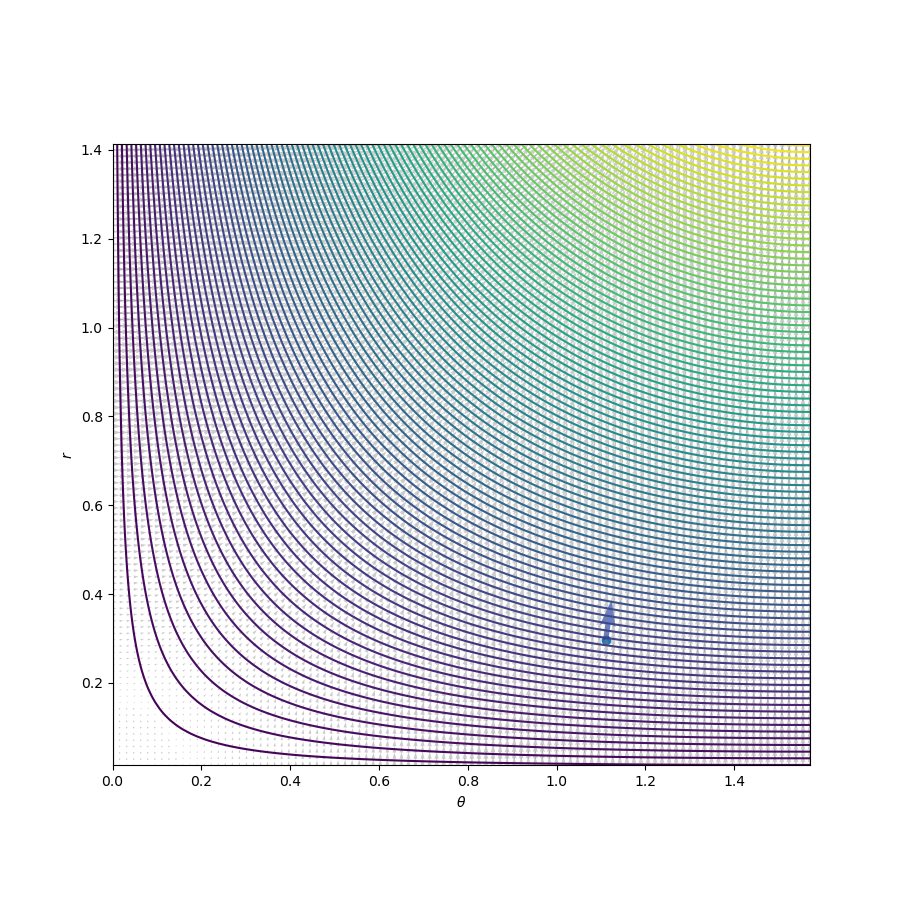

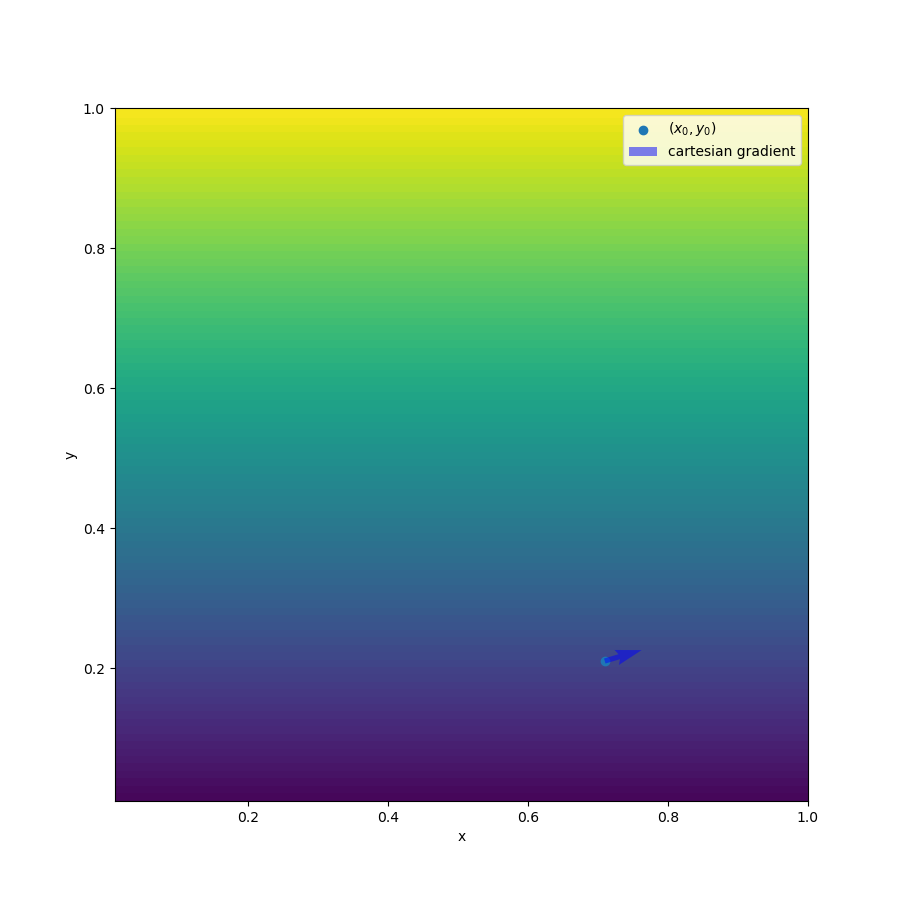

In [12]:
x = np.linspace(0.01,1,100)
y = np.linspace(0.01,1,100)

xg,yg = np.meshgrid(x,y)

rg = np.sqrt(xg**2 + yg**2)
thg = np.arctan(yg/xg)

i = 20
j = 70

x0 = xg[i,j]
y0 = yg[i,j]
r0 = rg[i,j]
th0 = thg[i,j]

grady,gradx = np.gradient(rg,yg[:,0],xg[0,:])

u = gradx[i,j]
v = grady[i,j]

r = np.linspace(np.sqrt(x[0]**2 + y[0]**2),np.sqrt(x[-1]**2+y[-1]**2),100)
th = np.linspace(0,np.pi/2,100)

thg,rg = np.meshgrid(th,r)

r0=rg[i,j]
th0=thg[i,j]
fg = rg*np.sin(thg)

dfdr = np.sin(thg)
dfdth = rg*np.cos(thg)

dfdr0 = dfdr[i,j]
dfdth0 = dfdth[i,j]

# now find the components of the gradient in (r,theta) coordinates
gradr,gradth = np.gradient(fg,rg[:,0],thg[0,:])

u_th = gradth[i,j]
v_r = gradr[i,j]


fig,ax = plt.subplots(figsize=(9,9))
ax.contour(thg,rg,fg,levels=100)
ax.scatter(th0,r0)
ax.quiver(th0,r0,u_th,v_r,angles='xy',scale_units='xy',scale=10,alpha=0.5,color='b',label='polar gradient')
ax.quiver(th0,r0,dfdth0,dfdr0,angles='xy',scale_units='xy',alpha=0.2,color='g',label='analytic gradient',scale=10)
ax.quiver(thg,rg,dfdth,dfdr,angles='xy',scale_units='xy',alpha=0.4,color='grey',label='analytic gradient',scale=40)

ax.set(aspect=1,xlabel=r'$\theta$',ylabel=r'$r$')
plt.show()

fig,ax = plt.subplots(figsize=(9,9))
ax.contourf(xg,yg,rg,levels=100)
ax.scatter(x0,y0,label=r'$(x_0,y_0)$')
ax.quiver(x0,y0,u,v,angles='xy',scale_units='xy',alpha=0.5,color='b',label='cartesian gradient')
ax.set(aspect=1,xlabel='x',ylabel='y')
ax.legend()
plt.show()


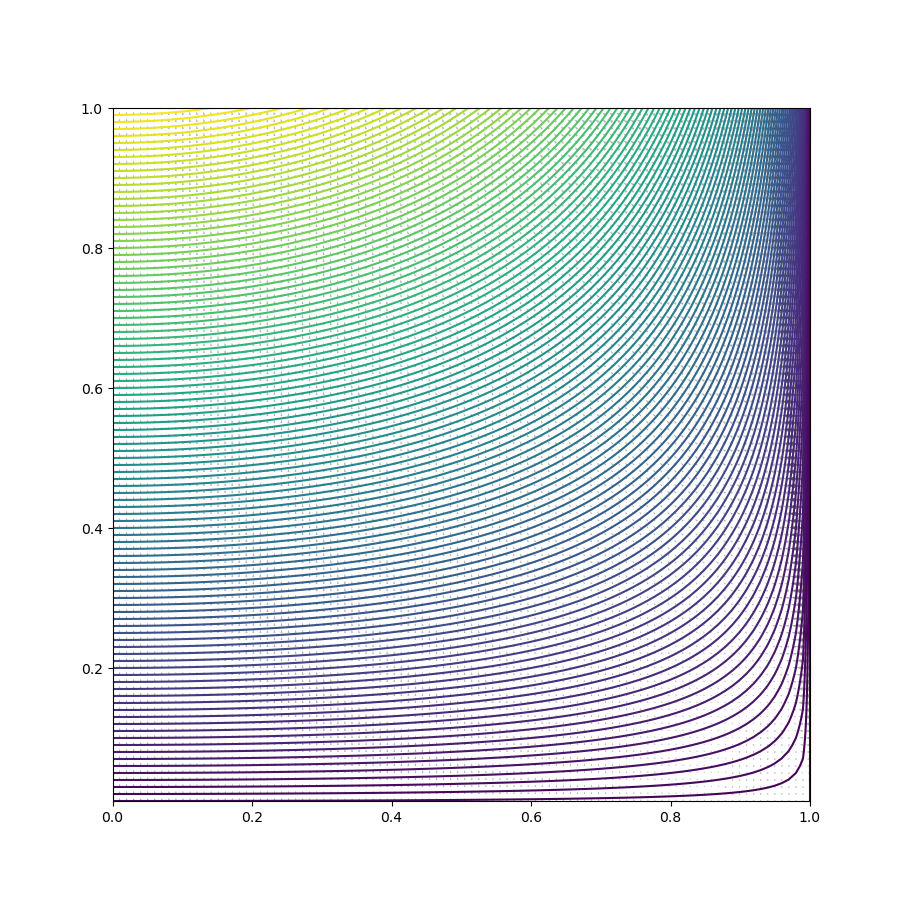

In [13]:
r = np.linspace(0.01,1,100)
mu = np.linspace(0,1,100)

mug,rg = np.meshgrid(mu,r)

fg = rg*np.sqrt(1-mug**2)


gradrg,gradmug = np.gradient(fg,rg[:,0],mug[0,:])

fig,ax = plt.subplots(figsize=(9,9))
ax.contour((mug),rg,fg,levels=100)
ax.quiver((mug),rg, gradmug,gradrg,angles='xy',scale_units='xy',alpha=0.3)
plt.show()

Testing how well $\frac{df}{d\xi} = \frac{\nabla\psi}{|\nabla\psi|}\cdot\nabla f$ works, when we use simple forms for $\psi$ and $f$.

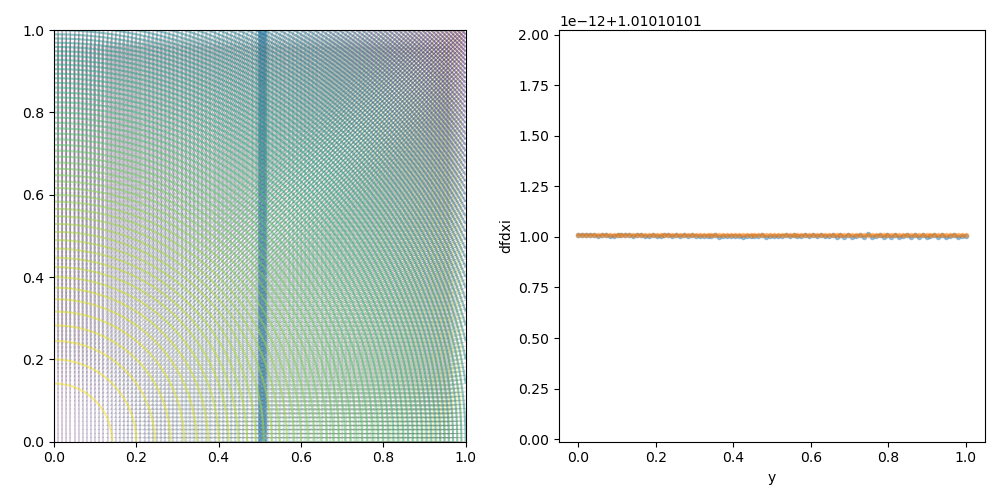

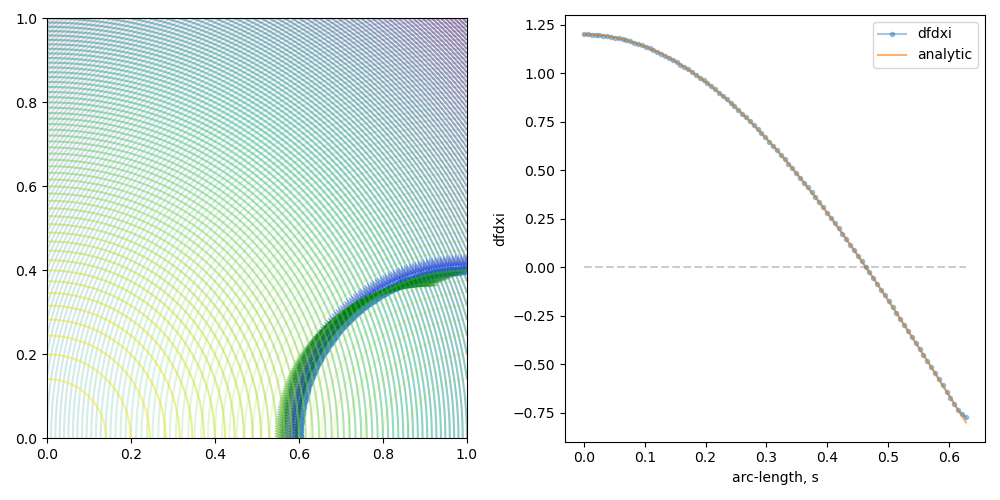

In [14]:
# function definitions
def interpolate_function(func, mu, x, dmu, dx, LOGSCALEX, X1LOW):

    # Find base point, and distance of (mu,x) from the base point
    if(LOGSCALEX == 1):
        x1 = np.log(x + np.exp(-X1LOW)) + X1LOW
    else:
        x1 = x


    if((np.abs(x1/dx - np.rint(x1/dx)) > 1e-10) & (np.abs(x1/dx - np.rint(x1/dx)) < 1e-6)):
        ix = int(np.rint(x1/dx))
        xs=0.0
    else:
        ix = int(np.floor(x1/dx))
        xs = x1/dx - ix

    if((ix+1) >= np.shape(func)[0]):
        ix = np.shape(func)[0]-2
        
    imu = int(np.floor(mu/dmu))
    mus = mu/dmu - imu

    f0 = func[ix,imu]
    f1 = func[ix, imu+1]
    f2 = func[ix+1, imu]
    f3 = func[ix+1,imu+1]

    value = xs*mus*f3 + xs*(1-mus)*f2 + (1-xs)*mus*f1 + (1-xs)*(1-mus)*f0

    return value

# generate grid
x,dx = np.linspace(0,1,100,retstep=True)
y,dy=np.linspace(0,1,100,retstep=True)
xg,yg=np.meshgrid(x,y)

index = 50
f = 1 - xg**2 - yg**2
psi = xg
grady,gradx = np.gradient(psi,y,x)
gradfy,gradfx = np.gradient(f,y,x)
xcoords = xg[:,index]
ycoords = yg[:,index]
gradpsi_interp = np.sqrt(gradx[:,index]**2 + grady[:,index]**2)
dfdxi = -1./np.abs(gradpsi_interp)*(gradfx[:,index]*gradx[:,index] + gradfy[:,index]*grady[:,index])

# second psi form
psi2 = 1 - (xg - 1)**2 - yg**2
grady_2,gradx_2 = np.gradient(psi2,y,x)
# generate points along curve
r = 0.4
theta = np.linspace(0,np.pi/2,100)
xcoords_2 = 1 - r*np.cos(theta)
ycoords_2 = r*np.sin(theta)


grad_interp_x = np.array([interpolate_function(gradx_2,xcoords_2[k], ycoords_2[k],dx,dy,0,0) for k in range(len(xcoords_2))])
grad_interp_y = np.array([interpolate_function(grady_2,xcoords_2[k], ycoords_2[k],dx,dy,0,0) for k in range(len(xcoords_2))])

grad_interp_fx = np.array([interpolate_function(gradfx,xcoords_2[k], ycoords_2[k],dx,dy,0,0) for k in range(len(xcoords_2))])
grad_interp_fy = np.array([interpolate_function(gradfy,xcoords_2[k], ycoords_2[k],dx,dy,0,0) for k in range(len(xcoords_2))])

gradpsi_interp_2 = np.sqrt(grad_interp_x**2 + grad_interp_y**2)

dfdxi_2 = -1/np.abs(gradpsi_interp_2)*(grad_interp_fx*grad_interp_x + grad_interp_fy*grad_interp_y)

ls = LineString(np.c_[xcoords_2,ycoords_2])
distances = np.linspace(0,ls.length,100)

# analytic form

dfdxi_2_analytic = -2/np.sqrt((xcoords_2 - 1)**2 +ycoords_2**2)*(xcoords_2*(xcoords_2 - 1) + ycoords_2**2)

fig,(ax,ax2) = plt.subplots(1,2,figsize=(10,5))
ax.contour(xg,yg,psi,levels=100,alpha=0.2)
ax.contour(xg,yg,f,levels=100,alpha = 0.5)
ax.scatter(xcoords,ycoords,alpha=0.4)
# ax.quiver(xg,yg,gradx,grady,angles='xy',scale_units='xy',alpha=0.4,color='grey',scale=40)
ax.quiver(xg,yg,gradfx,gradfy,angles='xy',scale_units='xy',alpha=0.4,color='grey',scale=40)
ax2.plot(ycoords,dfdxi,'.-',alpha=0.4,label='dfdxi')
ax2.plot(ycoords,2*xcoords,'.-',alpha=0.4,label='analytic')
ax2.set(xlabel='y',ylabel='dfdxi')
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

fig,(ax,ax2) = plt.subplots(1,2,figsize=(10,5))
ax.contour(xg,yg,psi2,levels=100,alpha=0.2)
ax.contour(xg,yg,f,levels=100,alpha = 0.5)
ax.scatter(xcoords_2,ycoords_2,alpha=0.4)
# ax.quiver(xg,yg,gradx_2,grady_2,angles='xy',scale_units='xy',alpha=0.4,color='grey',scale=40)
ax.quiver(xcoords_2,ycoords_2,-grad_interp_x,-grad_interp_y,angles='xy',scale_units='xy',alpha=0.4,color='blue',scale=20)
ax.quiver(xcoords_2,ycoords_2,grad_interp_fx,grad_interp_fy,angles='xy',scale_units='xy',alpha=0.4,color='green',scale=20)
ax2.plot(distances,dfdxi_2,'.-',alpha=0.4,label='dfdxi')
ax2.plot(distances,np.zeros_like(distances),'--k',alpha=0.2)
ax2.plot(distances,dfdxi_2_analytic,alpha=0.6,label='analytic')
ax.set_aspect('equal')
ax2.set(xlabel='arc-length, s',ylabel='dfdxi')
ax2.legend()
plt.tight_layout()
plt.show()

So this works in Cartesian coordinates. We need to check how it behaves in polar $(r,\theta)$ coordinates.

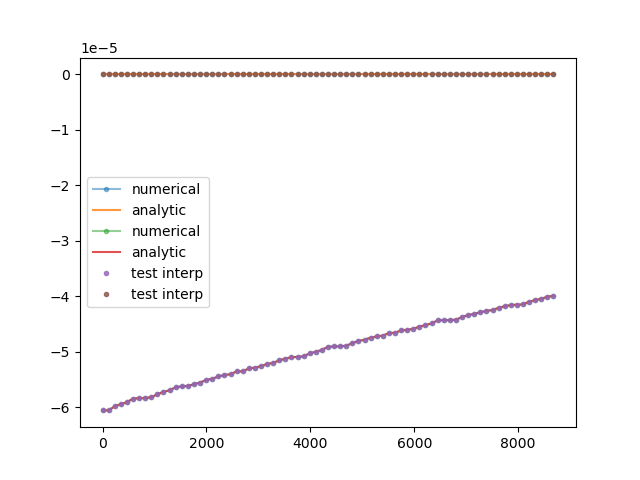

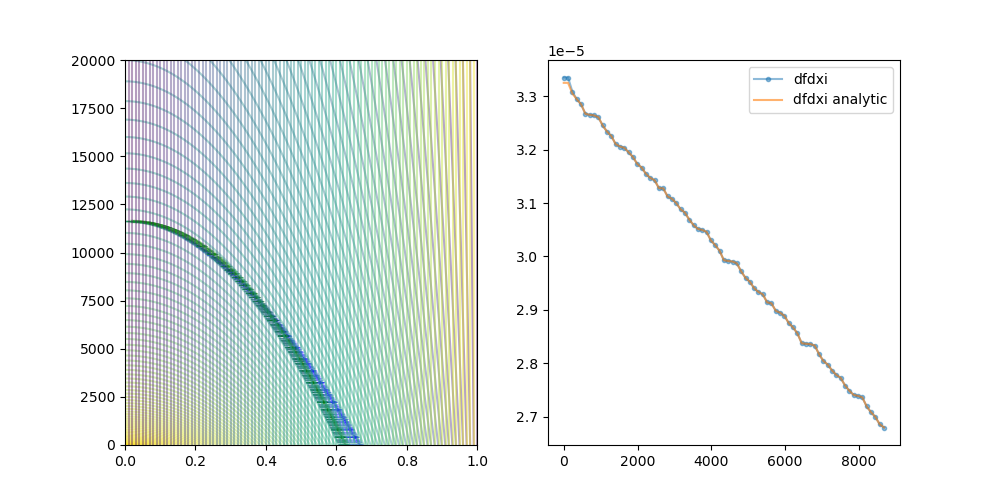

In [42]:
# function definitions
import sys
from contourpy import contour_generator
from scipy.interpolate import interpn

def gen_contour_array(xgrid, mugrid, psi_grid, psi_levels):

    cont_gen = contour_generator(mugrid, xgrid, psi_grid, quad_as_tri=True)
    lines_arr_0 = np.array(cont_gen.lines(psi_levels[0]))[0]
    contour_array = np.hstack((lines_arr_0,np.reshape(np.zeros(len(lines_arr_0)),(-1,1))))

    for index in range(1,len(psi_levels)):
        # check if cont_gen.lines() returns an empty array:
        lines = cont_gen.lines(psi_levels[index])
        if not lines:
        # if(len(lines) == 0):
            continue
        else:
            lines_arr = np.array(lines[0])
            contour_array = np.append(contour_array, np.hstack((lines_arr, np.reshape(index*np.ones(len(lines_arr)), (-1,1)))), axis=0)

    # remove any contour coordinates below some limit xlim:
    # contour_array_output = contour_array[((contour_array[:,1] < 1.e-10))|(contour_array[:,1] > 1.e-3)]
    # sys.exit()
    return contour_array

x0 = 0.5
R_star = 1e4

r,dr = np.linspace(R_star,3*R_star,100,retstep=True)

mu = np.copy(x)
mug,rg = np.meshgrid(mu,r)
rg = rg - R_star
r = r - R_star
aratio = R_star/x0

psi_grid = (1-mug**2)/(rg + aratio)

fg = mug

mulevels= np.linspace(1,0,100)
psi_levels = (1-mulevels**2)/aratio


contour_array = gen_contour_array(rg,mug,psi_grid,psi_levels)
index_val = 39
xcoords = contour_array[contour_array[:,2]==index_val][:,1]
mucoords = contour_array[contour_array[:,2]==index_val][:,0]

ls2 = LineString(np.c_[mucoords,xcoords])
distances = np.linspace(0,ls2.length,100)

gradpsi_r,gradpsi_mu = np.gradient(psi_grid,r,x)
gradf_r,gradf_mu = np.gradient(fg,r,x)

# use interpn to interpolate points to check
test_gradpsi_r_interp = np.reshape(np.array([interpn((r,x),gradpsi_r,(xcoords[k],mucoords[k])) for k in range(len(xcoords))]),-1)
test_gradpsi_mu_interp = np.reshape(np.array([interpn((r,x),gradpsi_mu,(xcoords[k],mucoords[k])) for k in range(len(xcoords))]),-1)
test_gradf_r_interp = np.reshape(np.array([interpn((r,x),gradf_r,(xcoords[k],mucoords[k])) for k in range(len(xcoords))]),-1)
test_gradf_mu_interp = np.reshape(np.array([interpn((r,x),gradf_mu,(xcoords[k],mucoords[k])) for k in range(len(xcoords))]),-1)

gradpsi_r_interp = np.array([interpolate_function(gradpsi_r,mucoords[k], xcoords[k],dx,dr,0,0) for k in range(len(xcoords))])
gradpsi_mu_interp = np.array([interpolate_function(gradpsi_mu,mucoords[k], xcoords[k],dx,dr,0,0) for k in range(len(xcoords))])

gradf_r_interp = np.array([interpolate_function(gradf_r,mucoords[k], xcoords[k],dx,dr,0,0) for k in range(len(xcoords))])
gradf_mu_interp = np.array([interpolate_function(gradf_mu,mucoords[k], xcoords[k],dx,dr,0,0) for k in range(len(xcoords))])

gradpsi_interp = np.sqrt(gradpsi_r_interp**2 + (1-mucoords**2)/(xcoords+aratio)**2*gradpsi_mu_interp**2)
test_gradpsi_interp = np.sqrt(test_gradpsi_r_interp**2 + (1-mucoords**2)/(xcoords+aratio)**2*test_gradpsi_mu_interp**2)

dfdxi = -1./np.abs(gradpsi_interp)*(gradf_r_interp*gradpsi_r_interp + (1-mucoords**2)/(xcoords+aratio)**2*gradpsi_mu_interp*gradf_mu_interp)
test_dfdxi = -1./np.abs(test_gradpsi_interp)*(test_gradf_r_interp*test_gradpsi_r_interp + (1-mucoords**2)/(xcoords+aratio)**2*test_gradpsi_mu_interp*test_gradf_mu_interp)
dfdxi_analytic = 2*mucoords/(xcoords+aratio)*np.sqrt((1-mucoords**2)/(1 + 3*mucoords**2))

dfdmu_analytic = 1
dfdx_analytic = 0

gradpsi_r_grid_analytic = -(1-mug**2)/(rg+aratio)**2
gradpsi_mu_grid_analytic = -2*mug/(rg+aratio)

dpsi_dr_analytic = -(1-mucoords**2)/(xcoords+aratio)**2
dpsi_dmu_analytic = -2*mucoords/(xcoords+aratio)

end_index = 75
fig,ax = plt.subplots()
ax.plot(distances[:end_index],gradpsi_r_interp[:end_index],'.-',label='numerical', alpha = 0.5)
ax.plot(distances[:end_index],dpsi_dr_analytic[:end_index], alpha = 0.8,label='analytic')
ax.plot(distances[:end_index],gradpsi_mu_interp[:end_index],'.-',label='numerical', alpha = 0.5)
ax.plot(distances[:end_index],dpsi_dmu_analytic[:end_index], alpha = 0.8,label='analytic')
ax.plot(distances[:end_index],test_gradpsi_mu_interp[:end_index], '.',alpha = 0.8,label='test interp')
ax.plot(distances[:end_index],test_gradpsi_r_interp[:end_index], '.',alpha = 0.8,label='test interp')
ax.legend()
plt.show()

fig,(ax,ax2) = plt.subplots(1,2,figsize=(10,5))
ax.contour((mug),rg,psi_grid,levels=psi_levels,alpha=0.4)
# ax.scatter((mucoords),xcoords,s=10)
ax.quiver(mucoords,xcoords,-gradpsi_mu_interp,-gradpsi_r_interp,angles='xy',scale_units='xy',color='blue',alpha=0.4)
ax.quiver(mucoords,xcoords,gradf_mu_interp,gradf_r_interp,angles='xy',scale_units='xy',color='green',alpha=0.4)
ax.contour(mug,rg,fg,levels=100,alpha=0.4)
# ax.plot(np.arange(0,100),psi_levels,'.-')
ax2.plot(distances[:end_index],dfdxi[:end_index],'.-',alpha=0.5,label='dfdxi')
# ax2.plot(distances[:end_index],test_dfdxi[:end_index],'.-',alpha=0.5,label='test dfdxi')
ax2.plot(distances[:end_index],dfdxi_analytic[:end_index],alpha=0.6,label='dfdxi analytic')
# ax2.set(ylim=[0,1e-3])
ax2.legend()
plt.show()

So the interpolation scheme works in polar coordinates as well. Now check if magnetic field term $B'/B$ is being calculated correctly, for a dipolar magnetic field.

Analytically, we have 
\begin{equation}
B = \frac{(1 + 3\mu^2)^{1/2}}{(x+a)^3} 
\end{equation}
We have
\begin{equation}
B' = -\frac{1}{|\nabla\psi|}\left(\frac{\partial B}{\partial x}\frac{\partial \psi}{\partial x} + \frac{(1-\mu^2)}{(x+a)}\frac{\partial B}{\partial \mu}\frac{\partial \psi}{\partial \mu}\right)
\end{equation}
which means $B'/B$ is 
\begin{equation}
\frac{B'}{B} = -\frac{3(1-\mu^2)^{1/2}}{(x+a)^4}\frac{1 + \mu^2}{1+3\mu^2}
\end{equation}

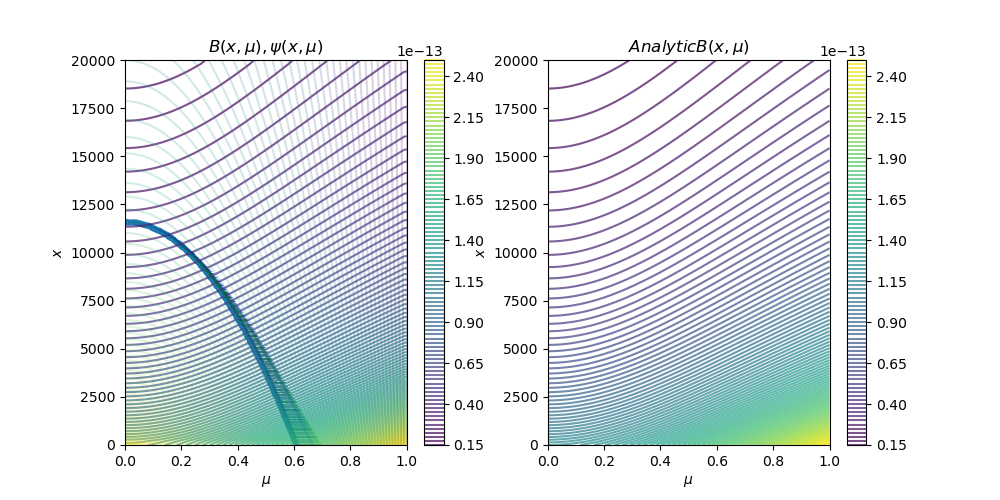

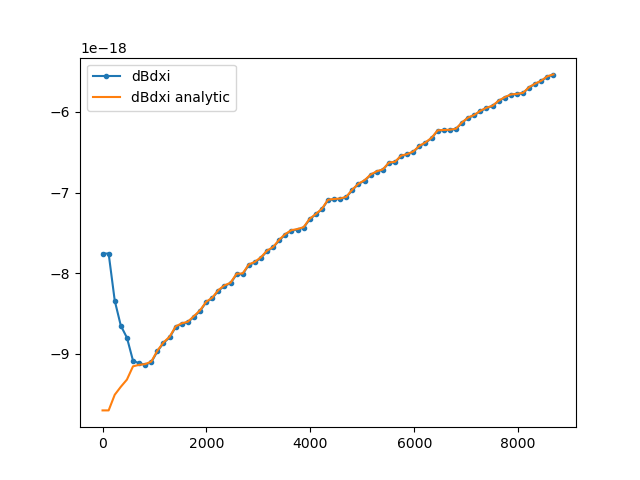

In [44]:
magx = 1/(rg+aratio)/(rg+aratio)*gradpsi_mu
magmu = np.zeros_like(magx)
magmu[mug!=1] = 1./np.sqrt(1.0-mug[mug!=1]*mug[mug!=1])/(rg[mug!=1]+aratio)*gradpsi_r[mug!=1]
mag = np.sqrt(magx*magx + magmu*magmu)


gradf_r,gradf_mu = np.gradient(mag,r,x)
gradf_r_interp = np.array([interpolate_function(gradf_r,mucoords[k], xcoords[k],dx,dr,0,0) for k in range(len(xcoords))])
gradf_mu_interp = np.array([interpolate_function(gradf_mu,mucoords[k], xcoords[k],dx,dr,0,0) for k in range(len(xcoords))])

test_gradf_r_interp = np.reshape(np.array([interpn((r,x),gradf_r,(xcoords[k],mucoords[k])) for k in range(len(xcoords))]),-1)
test_gradf_mu_interp = np.reshape(np.array([interpn((r,x),gradf_mu,(xcoords[k],mucoords[k])) for k in range(len(xcoords))]),-1)

dfdmu_analytic = 3*mucoords/(xcoords+aratio)**3/np.sqrt(1+3*mucoords**2)

f_analytic = 1/(rg + aratio)**3*np.sqrt(1+3*mug**2)

dfdxi = -1./np.abs(gradpsi_interp)*(gradf_r_interp*gradpsi_r_interp + (1-mucoords**2)/(xcoords+aratio)**2*gradpsi_mu_interp*gradf_mu_interp)
test_dfdxi = -1./np.abs(test_gradpsi_interp)*(test_gradf_r_interp*test_gradpsi_r_interp + (1-mucoords**2)/(xcoords+aratio)**2*test_gradpsi_mu_interp*test_gradf_mu_interp)
dfdxi_analytic = -3*np.sqrt(1-mucoords**2)/(xcoords+aratio)**4*(1+mucoords**2)/(1+3*mucoords**2)

fig,(ax,ax2) = plt.subplots(1,2,figsize=(10,5))
ax.set(title=r"$B(x,\mu), \psi(x,\mu)$",xlabel=r"$\mu$",ylabel=r"$x$")
cb=ax.contour((mug),(rg),mag,levels=100,alpha = 0.7)
ax.contour((mug),(rg),psi_grid,levels=psi_levels,alpha = 0.2)
ax.scatter((mucoords),(xcoords),s=10)
ax2.set(title=r"$Analytic B(x,\mu)$",xlabel=r"$\mu$",ylabel=r"$x$")
cb2=ax2.contour((mug),(rg),f_analytic,levels=100,alpha = 0.7)
ax.quiver(mucoords,xcoords,-gradpsi_mu_interp,-gradpsi_r_interp,angles='xy',scale_units='xy',alpha=0.4,color='blue')
ax.quiver(mucoords,xcoords,gradf_mu_interp,gradf_r_interp,angles='xy',scale_units='xy',alpha=0.4,color='green')
fig.colorbar(cb,ax=ax)
fig.colorbar(cb2,ax=ax2)
# ax.set_aspect('equal')
plt.show()

fig,ax = plt.subplots()
ax.plot(distances[:end_index],dfdxi[:end_index],'.-',label='dBdxi')
ax.plot(distances[:end_index],dfdxi_analytic[:end_index],label='dBdxi analytic')
# ax.plot(np.log10(xcoords[:end_index]),dfdxi[:end_index],'.-',label='dBdxi')
# ax.plot(np.log10(xcoords[:end_index]),dfdxi_analytic[:end_index],label='dBdxi analytic')
# # ax.plot(np.log10(xcoords[:end_index]),test_dfdxi[:end_index],label='dBdxi test')
# # ax.plot(distances[:end_index],test_dfdxi[:end_index], label='test dfdxi')
ax.legend()
plt.show()

First positive coordinates: 0.09090909090909091
Last positive coordinates: 0.7070707070707072


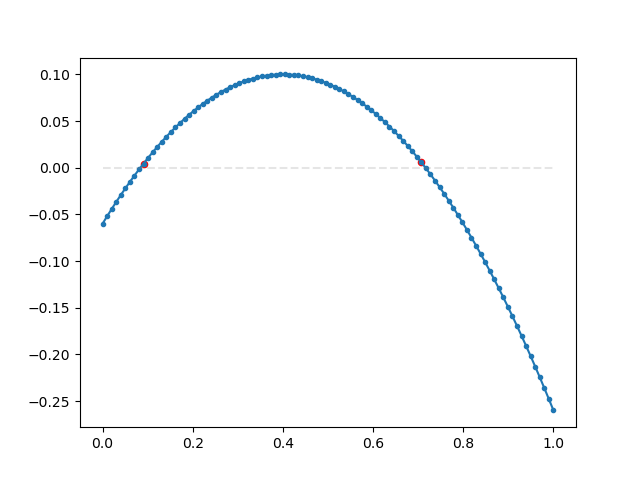

In [17]:
# test script to find where along flux line the value of delta first turns positive, and where it last turns positive
x = np.linspace(0,1,100)
y = -(x-0.4)**2 +0.1

# Find the first and last indices where the value is positive
first_positive_index = np.argmax(y > 0)
last_positive_index = len(y) - 1 - np.argmax(y[::-1] > 0)

# Extract the corresponding coordinates from reduced_array
first_positive_coordinates = x[first_positive_index]
last_positive_coordinates = x[last_positive_index]

print("First positive coordinates:", first_positive_coordinates)
print("Last positive coordinates:", last_positive_coordinates)

fig,ax = plt.subplots()
ax.plot(x,y,'.-')
ax.scatter(first_positive_coordinates,y[first_positive_index],c='r',s=20)
ax.scatter(last_positive_coordinates,y[last_positive_index],c='r',s=20)

ax.plot(x,np.zeros_like(x),'--',c='grey',alpha=0.2)
plt.show()

First positive coordinates: 0.010101010101010102
Last positive coordinates: 0.9393939393939394


/var/folders/72/5_kw1gh53nn015l6nm1_9csw0000gn/T/ipykernel_13878/4219893189.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


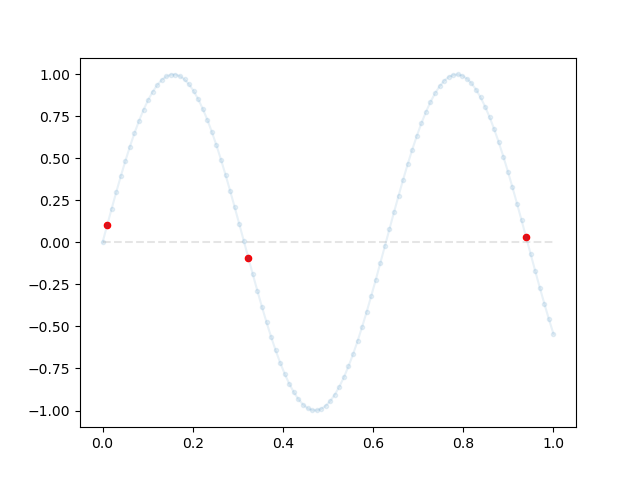

In [18]:
# instead want it when the array **next** goes negative
y = np.sin(x*10)


# Find the first and last indices where the value is positive
first_positive_index = np.argmax(y > 0)
last_positive_index = len(y) - 1 - np.argmax(y[::-1] > 0)

# Extract the corresponding coordinates from reduced_array
first_positive_coordinates = x[first_positive_index]
subsequent_negative_index = first_positive_index + np.argmax(y[first_positive_index:] < 0)
subsequent_neg_coords= x[subsequent_negative_index]
last_positive_coordinates = x[last_positive_index]

print("First positive coordinates:", first_positive_coordinates)
print("Last positive coordinates:", last_positive_coordinates)

fig,ax = plt.subplots()
ax.plot(x,y,'.-',alpha =0.1)
ax.scatter(first_positive_coordinates,y[first_positive_index],c='r',s=20)
ax.scatter(subsequent_neg_coords,y[subsequent_negative_index],c='r',s=20)
ax.scatter(last_positive_coordinates,y[last_positive_index],c='r',s=20)

ax.plot(x,np.zeros_like(x),'--',c='grey',alpha=0.2)
plt.show()

7.576119861257727
-88.90124187809711
-0.0002999999838477667


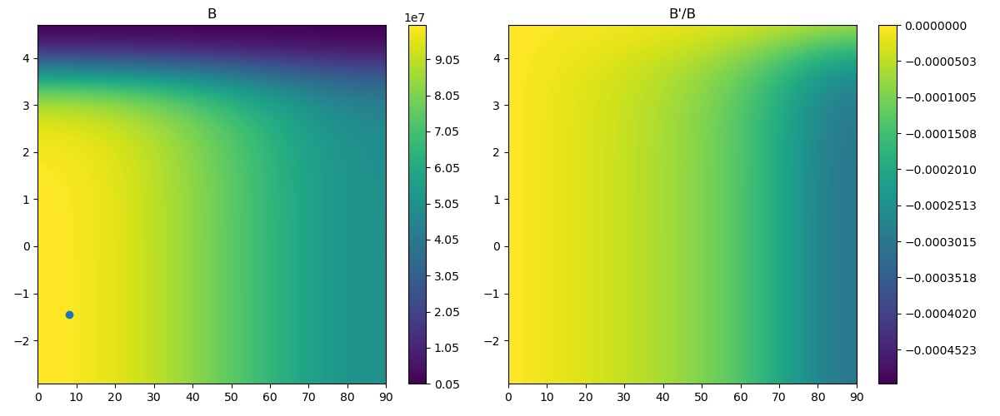

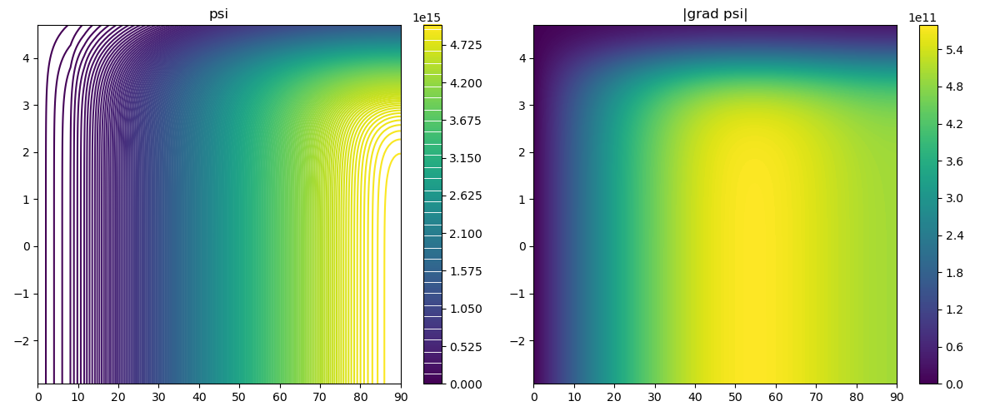

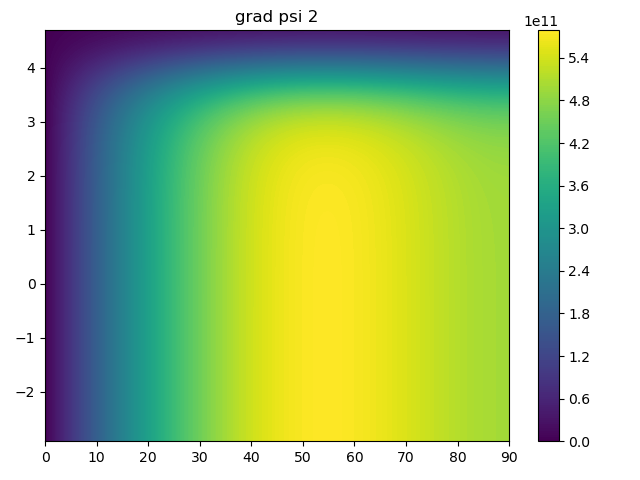

In [120]:

# check the analytic value for B'/B for a dipolar magnetic field.
B_star = 1e8
psi_star = 0.5*B_star*R_star**2
x = np.logspace(-3,np.log10(50000),100)

mugrid,xgrid = np.meshgrid(mu,x)
cs = 1e6
G = 6.67e-11
M_sol = 1.989e30
M_star = 1.4*M_sol
x0 = cs**2*R_star**2/G/M_star
aratio = R_star/x0
psi_grid = psi_star*R_star*(1 - mugrid**2)/x0/(xgrid+aratio)


mag = psi_star*aratio*np.sqrt(1+3*mugrid**2)/x0/x0/(xgrid+aratio)**3
b_term = -3*np.sqrt(1-mugrid**2)*(1+mugrid**2)/x0/(xgrid+aratio)/(1+3*mugrid**2)**1.5

gradpsi_x,gradpsi_mu = np.gradient(psi_grid,x,mu)
gradmag_x,gradmag_mu = np.gradient(mag,x,mu)

gradpsi_x = gradpsi_x/x0
gradmag_x = gradmag_x/x0

gradpsi = psi_star*aratio*np.sqrt(1-mugrid**2)*np.sqrt(1+3*mugrid**2)/x0/(xgrid + aratio)**2
gradpsi2 = np.sqrt(gradpsi_x**2 + (1-mugrid**2)/x0/x0/(xgrid + aratio)**2*gradpsi_mu**2)

i = 20
j = 98
angle = np.arctan(gradpsi_x[i,j]/np.sqrt(1-mugrid[i,j]**2)*(xgrid[i,j]+aratio)/gradpsi_mu[i,j])
mag_angle = np.arctan(gradmag_x[i,j]/np.sqrt(1-mugrid[i,j]**2)*(xgrid[i,j]+aratio)/gradmag_mu[i,j])
print(angle*180./np.pi)
print(mag_angle*180./np.pi)
print(np.min(b_term))
fig,(ax,ax2) = plt.subplots(1,2,figsize=(12,5))
# ax.quiver(180./np.pi*np.arccos(mugrid[1:,:]),np.log10(xgrid[1:,:]),-gradmag_mu[1:,:], gradmag_x[1:,:],angles='xy',scale_units='xy')
cb=ax.contourf(180./np.pi*np.arccos(mugrid[1:,:]),np.log10(xgrid[1:,:]), mag[1:,:], levels=200)
ax.scatter(180./np.pi*np.arccos(mugrid[i,j]), np.log10(xgrid[i,j]))
cb2=ax2.contourf(180./np.pi*np.arccos(mugrid[1:,:]),np.log10(xgrid[1:,:]), b_term[1:,:], levels=np.linspace(-0.0005,0,200))
fig.colorbar(cb,ax=ax)
fig.colorbar(cb2,ax=ax2)
plt.tight_layout()
ax.set(title="B")
ax2.set(title="B\'/B")
plt.show()

fig,(ax,ax2) = plt.subplots(1,2,figsize=(12,5))
cb=ax.contour(180./np.pi*np.arccos(mugrid[1:,:]),np.log10(xgrid[1:,:]), psi_grid[1:,:], levels=200)
cb2=ax2.contourf(180./np.pi*np.arccos(mugrid[1:,:]),np.log10(xgrid[1:,:]), gradpsi[1:,:], levels=200)
fig.colorbar(cb,ax=ax)
fig.colorbar(cb2,ax=ax2)
plt.tight_layout()
ax.set(title="psi")
ax2.set(title="|grad psi|")
plt.show()

fig,ax = plt.subplots()
cb=ax.contourf(180./np.pi*np.arccos(mugrid[1:,:]),np.log10(xgrid[1:,:]), gradpsi2[1:,:], levels=200)
fig.colorbar(cb,ax=ax)
plt.tight_layout()
ax.set(title="grad psi 2")
plt.show()


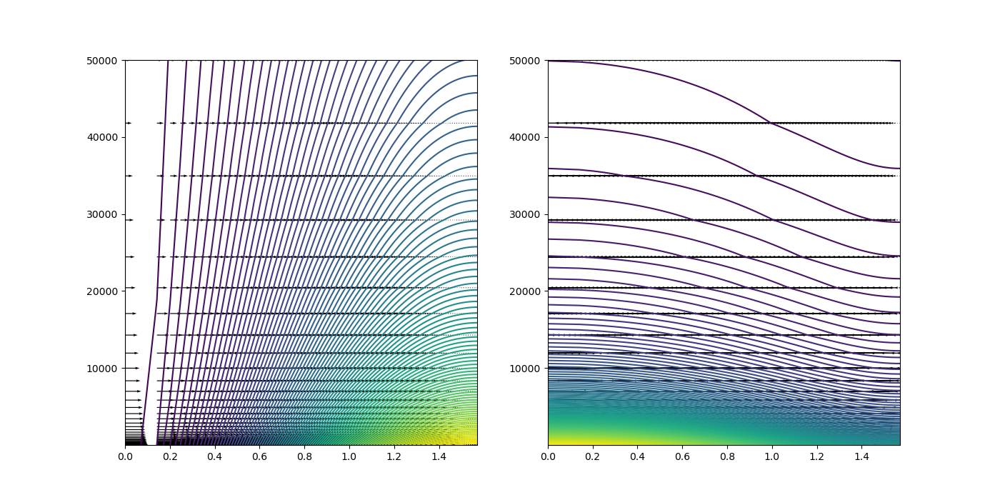

In [108]:
fig,(ax,ax2)= plt.subplots(1,2,figsize=(14,7))
ax.contour(np.arccos(mugrid),xgrid,psi_grid,levels=100)
ax.quiver(np.arccos(mugrid),xgrid,-gradpsi_mu,gradpsi_x,angles='xy',scale_units='xy',scale=1e17)
ax2.contour(np.arccos(mugrid),xgrid,mag,levels=100)
ax2.quiver(np.arccos(mugrid),xgrid,-gradmag_mu,gradmag_x,angles='xy',scale_units='xy',scale=1e7)
plt.show()